# Figure 5: Denmark Strait freshwater transport adjoint sensitivities

This notebook will reproduce Figure 5 from  E. Boland et al. 2025 (doi to come). This requires input datafiles (expects to find them in ../data_out) to run - please see the README for details.

Please attribute any plots or code from this notebook using the DOI from Zenodo: TO COME

E Boland Jan 2025 [emmomp@bas.ac.uk](email:emmomp@bas.ac.uk)

In [1]:
import xarray as xr
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import sys
sys.path.insert(0,'/users/emmomp/Python/ECCOv4-py')
import ecco_v4_py as ecco
import cartopy.crs as ccrs
import utils as ut
from inputs import *
import warnings
warnings.filterwarnings('ignore')

In [2]:
adj_vars=['adxx_qnet','adxx_empmr','adxx_tauu','adxx_tauv']

lags=[0,-0.25,-0.5,-1.5,-4]
lag_labels=['0 to -3m lag','-3m to -6m lag','-6m to -18m lag','-18m to -4 y lag','0 to -4 y lag']
lag_lengths=[lags[i]-lags[i+1] for i in range(0,len(lags)-1)]
lag_lengths=lag_lengths+[4,]

mth_i=[3,6,9,12]

In [3]:
ds_plot_all=[]
for year in eyears:
    ds_plot=xr.open_mfdataset(f'{CONTR_DIR}/{year}/ecco_2dconvs_{year}*nc',concat_dim='lag_range',combine='nested')
    ds_plot['exp']=[str(x) for x in ds_plot.exp.data]
    ds_plot_all.append(ds_plot.assign_coords({'eyear':year}).swap_dims({'exp':'month'}).drop_vars('exp'))
ds_plot_all=xr.concat(ds_plot_all,'eyear',coords='minimal')
ds_plot_all['wind_OCE']=ds_plot_all['adxx_tauuXoceTAUU']+ds_plot_all['adxx_tauvXoceTAUV']

In [4]:
ds_plot_full=ds_plot_all.stack({'ym':['month','year']}).sortby('dates')
ds_plot_full

<xarray.Dataset> Size: 24GB
Dimensions:              (eyear: 3, lag_range: 4, tile: 13, j: 90, i: 90,
                          ym: 264)
Coordinates: (12/17)
  * tile                 (tile) int64 104B 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j                    (j) int64 720B 0 1 2 3 4 5 6 7 ... 83 84 85 86 87 88 89
  * i                    (i) int64 720B 0 1 2 3 4 5 6 7 ... 83 84 85 86 87 88 89
    transp               <U2 8B 'fw'
    XC                   (tile, j, i) float32 421kB -111.6 -111.3 ... -111.9
    YC                   (tile, j, i) float32 421kB -88.24 -88.38 ... -88.1
    ...                   ...
    dates                (ym) datetime64[ns] 2kB 1996-01-16 ... 2017-12-16
  * lag_range            (lag_range) <U16 256B '0 to -3m lag' ... '-6m to -18...
  * eyear                (eyear) <U4 48B '2006' '2014' '2000'
  * ym                   (ym) object 2kB MultiIndex
  * month                (ym) int64 2kB 1 2 3 4 5 6 7 8 9 ... 5 6 7 8 9 10 11 12
  * year                 (ym) int64 2kB 1996 1996 1996 1996 ... 2017 2017 2017
Data variables:
    adxx_qnetXEXFqnet    (eyear, lag_range, tile, j, i, ym) float64 3GB dask.array<chunksize=(1, 1, 13, 90, 90, 264), meta=np.ndarray>
    adxx_qnetXoceQnet    (eyear, lag_range, tile, j, i, ym) float64 3GB dask.array<chunksize=(1, 1, 13, 90, 90, 264), meta=np.ndarray>
    adxx_tauuXoceTAUU    (eyear, lag_range, tile, j, i, ym) float64 3GB dask.array<chunksize=(1, 1, 13, 90, 90, 264), meta=np.ndarray>
    adxx_tauuXEXFtauu    (eyear, lag_range, tile, j, i, ym) float64 3GB dask.array<chunksize=(1, 1, 13, 90, 90, 264), meta=np.ndarray>
    adxx_tauvXoceTAUV    (eyear, lag_range, tile, j, i, ym) float64 3GB dask.array<chunksize=(1, 1, 13, 90, 90, 264), meta=np.ndarray>
    adxx_tauvXEXFtauv    (eyear, lag_range, tile, j, i, ym) float64 3GB dask.array<chunksize=(1, 1, 13, 90, 90, 264), meta=np.ndarray>
    adxx_empmrXEXFempmr  (eyear, lag_range, tile, j, i, ym) float64 3GB dask.array<chunksize=(1, 1, 13, 90, 90, 264), meta=np.ndarray>
    adxx_empmrXoceFWflx  (eyear, lag_range, tile, j, i, ym) float64 3GB dask.array<chunksize=(1, 1, 13, 90, 90, 264), meta=np.ndarray>
    wind_OCE             (eyear, lag_range, tile, j, i, ym) float64 3GB dask.array<chunksize=(1, 1, 13, 90, 90, 264), meta=np.ndarray>

In [5]:
xmin,xmax,ymin,ymax=(-2266791.253073855,
 3358349.2597455736,
 -2166791.253073855,
 3458349.2597455736)
proj_dict={'projection_type':'ortho','user_lon_0':-45,'user_lat_0':70}
my_projn = ccrs.Orthographic(central_longitude=-45,central_latitude=70)
[section_pt1,section_pt2]=ecco.get_section_endpoints('Denmark Strait')

In [8]:
mth_mean.sel(lag_range=lag)

<xarray.DataArray 'wind_OCE' (tile: 13, j: 90, i: 90)> Size: 842kB
dask.array<getitem, shape=(13, 90, 90), dtype=float64, chunksize=(13, 90, 90), chunktype=numpy.ndarray>
Coordinates:
  * tile       (tile) int64 104B 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j          (j) int64 720B 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * i          (i) int64 720B 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
    transp     <U2 8B 'fw'
    XC         (tile, j, i) float32 421kB -111.6 -111.3 -110.9 ... -105.6 -111.9
    YC         (tile, j, i) float32 421kB -88.24 -88.38 -88.52 ... -88.08 -88.1
    CS         (tile, j, i) float32 421kB 0.06158 0.06675 ... -0.9854 -0.9984
    SN         (tile, j, i) float32 421kB -0.9981 -0.9978 ... -0.1705 -0.05718
    rA         (tile, j, i) float32 421kB 3.623e+08 3.633e+08 ... 3.611e+08
    Depth      (tile, j, i) float32 421kB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    TRANSP     <U2 8B 'fw'
    lag_range  <U16 64B '-18m to -4 y lag'

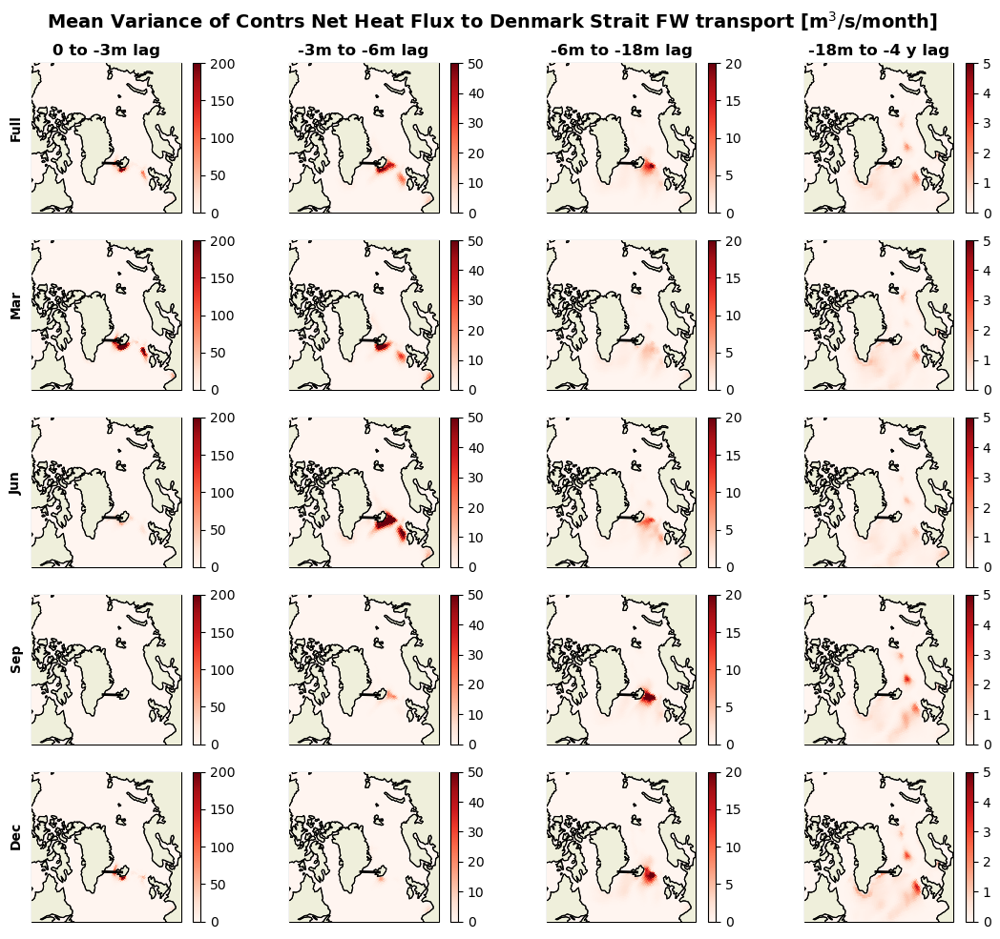

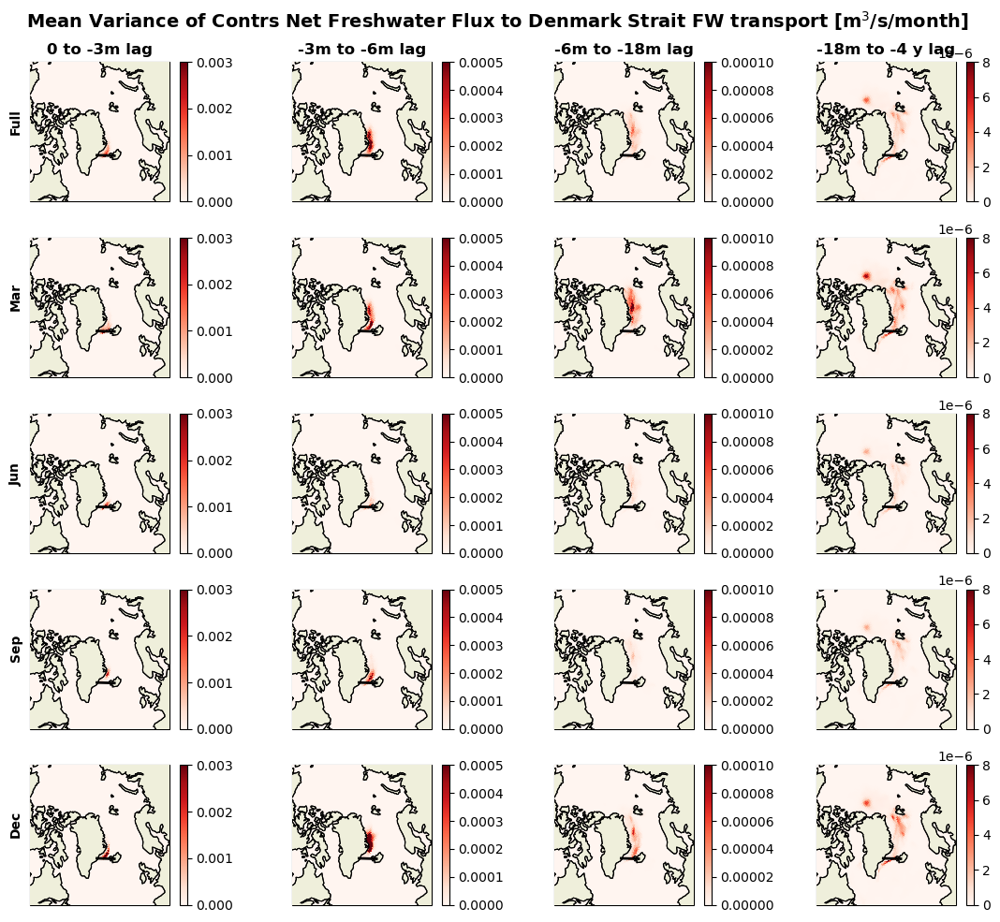

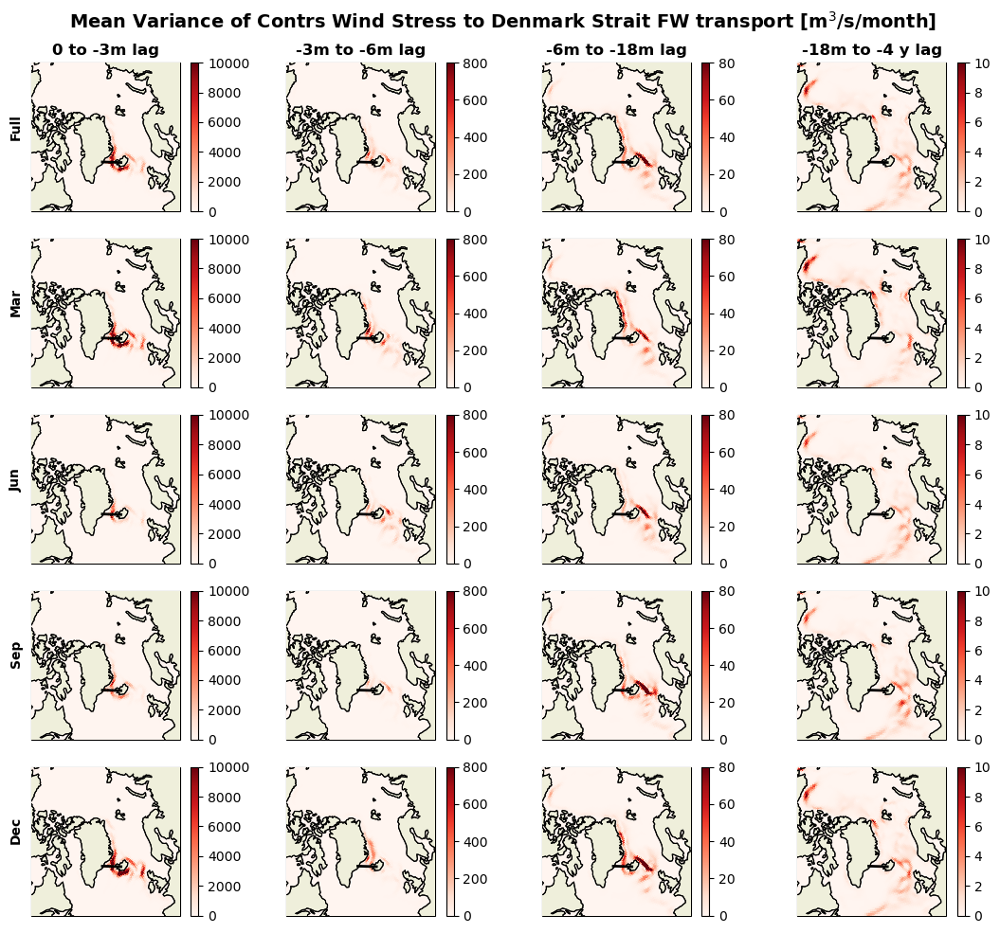

In [12]:
clims=dict(zip(oce_vars,[[200,50,20,5],[1e4,80,80,80],[1e4,80,80,80],[3e-3,5e-4,1e-4,0.8e-5],[1e4,800,80,10]]))
plot_vars=['adxx_qnetXoceQnet','adxx_empmrXoceFWflx','wind_OCE']
var_label=['oceQnet','oceFWflx','wind_OCE']
for iv,var in enumerate(plot_vars): 
    fig=plt.figure(figsize=[11,10])
    pp=1
    mth_mean=ds_plot_full[var].var('ym').mean('eyear')
    for ilag,lag in enumerate(lag_labels[:-1]):
        [f,ax,p]=ut.plot_ecco(ecco_grid,(mth_mean.sel(lag_range=lag))/(12*lag_lengths[ilag]),subplot_grid=[5,4,pp],
                           **proj_dict,cmap='Reds',
                           cmin=0,cmax=clims[var_label[iv]][ilag]
                          )
        ax.set_extent([xmin,xmax,ymin,ymax], crs=my_projn)
        ax.plot([section_pt1[0],section_pt2[0]],[section_pt1[1],section_pt2[1]],
             color='k', linewidth=2,transform=ccrs.PlateCarree(),zorder=1000)
        if pp<5:
            plt.title(lag,fontsize=12,fontweight='bold')
        if ilag==0:
            ax.text(-0.1,0.5,'Full',transform=ax.transAxes,rotation='vertical',ha='center',fontweight='bold')
        pp+=1
    
    for mth in mth_i:
        mth_var=(ds_plot_all[var].sel(month=mth)).var('year').mean('eyear')
        for ilag,lag in enumerate(lag_labels[:-1]):
            [f,ax,p]=ut.plot_ecco(ecco_grid,(mth_var.sel(lag_range=lag))/(12*lag_lengths[ilag]),subplot_grid=[5,4,pp],
                               **proj_dict,cmap='Reds',
                               cmin=0,cmax=clims[var_label[iv]][ilag]
                              )
            ax.set_extent([xmin,xmax,ymin,ymax], crs=my_projn)
            ax.plot([section_pt1[0],section_pt2[0]],[section_pt1[1],section_pt2[1]],
                 color='k', linewidth=2,transform=ccrs.PlateCarree(),zorder=1000)
            if pp<5:
                plt.title(lag,fontsize=12,fontweight='bold')
            if ilag==0:
                ax.text(-0.1,0.5,f'{imth[mth]}',transform=ax.transAxes,rotation='vertical',ha='center',fontweight='bold')
            pp+=1
    plt.suptitle(f'Mean Variance of Contrs {exf_labels[var_label[iv]]} to Denmark Strait FW transport [m$^3$/s/month]',fontsize=14,fontweight='bold')
    plt.tight_layout()

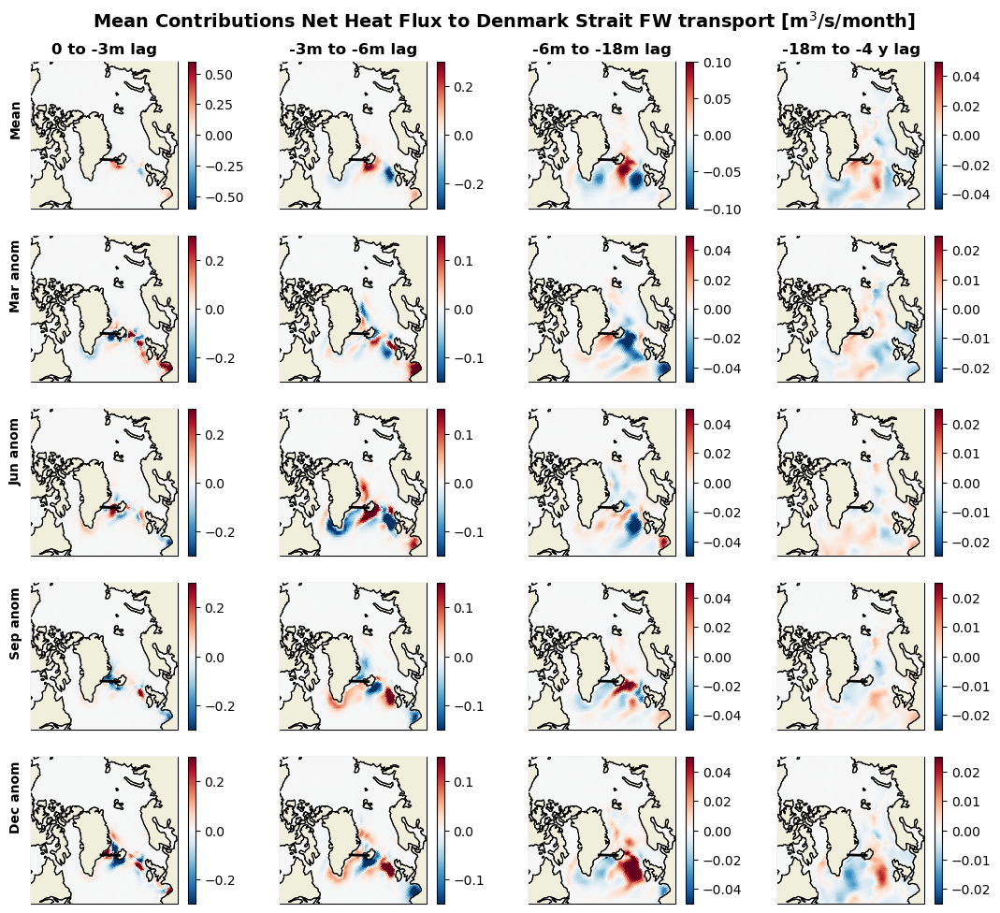

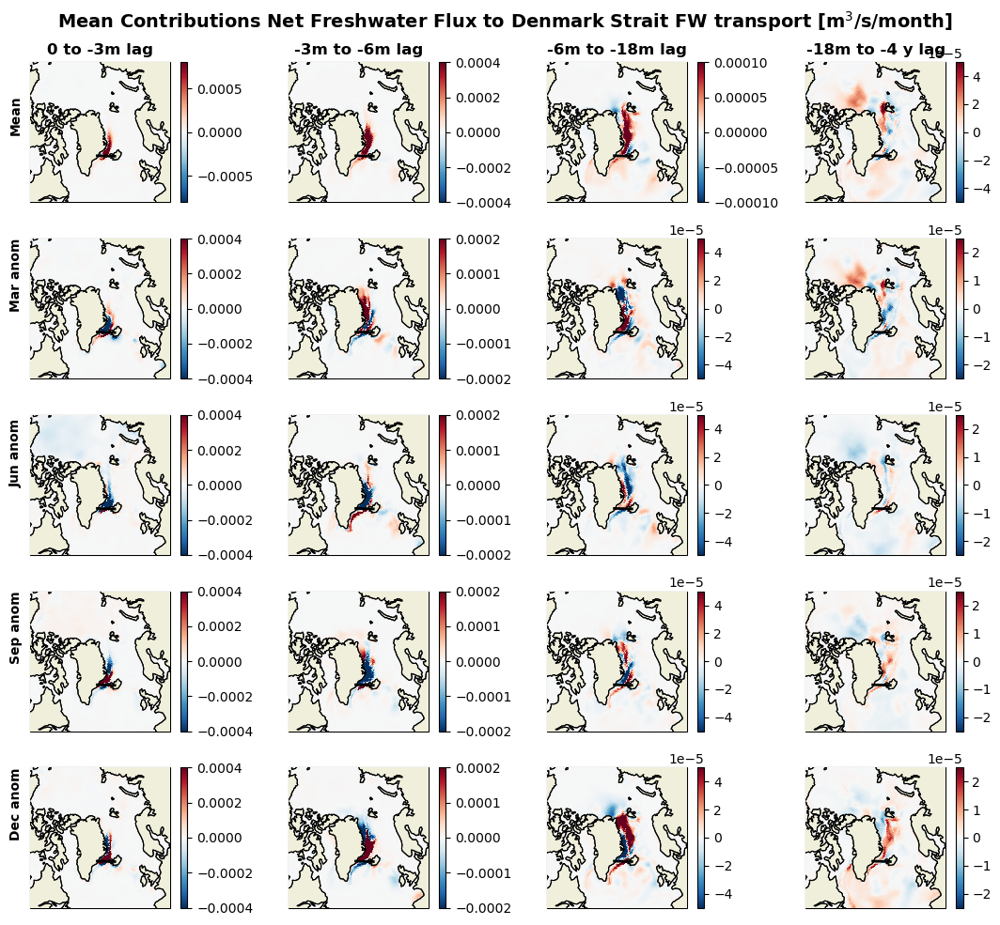

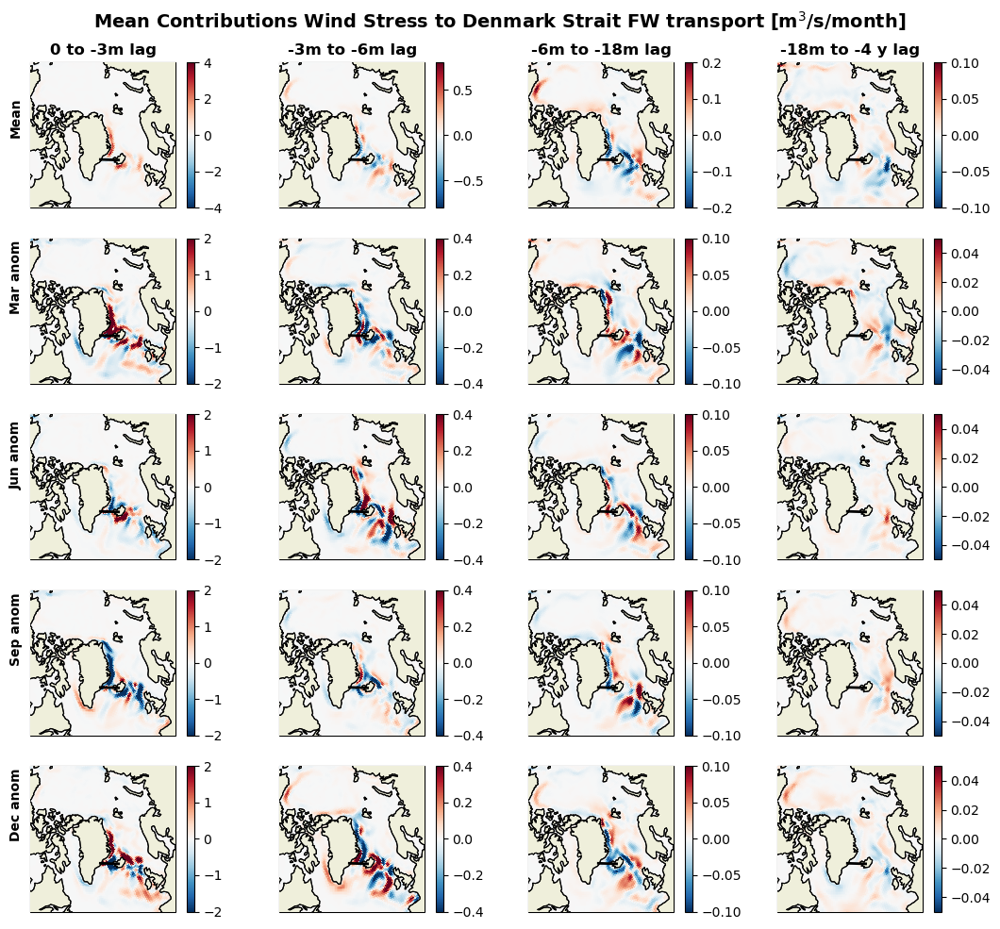

In [10]:
clims=dict(zip(oce_vars,[[0.6,0.3,0.1,0.05],[4,0.8,0.2,0.1],[4,0.8,0.2,0.1],[8e-4,4e-4,1e-4,5e-5],[4,0.8,0.2,0.1]]))
plot_vars=['adxx_qnetXoceQnet','adxx_empmrXoceFWflx','wind_OCE']
var_label=['oceQnet','oceFWflx','wind_OCE']
for iv,var in enumerate(plot_vars): 
    fig=plt.figure(figsize=[11,10])
    pp=1
    mth_mean=ds_plot_all[var].mean(['month','eyear','year'])
    for ilag,lag in enumerate(lag_labels[:-1]):
        [f,ax,p]=ut.plot_ecco(ecco_grid,(mth_mean.sel(lag_range=lag))/(12*lag_lengths[ilag]),subplot_grid=[5,4,pp],
                           **proj_dict,
                           cmin=-clims[var_label[iv]][ilag],cmax=clims[var_label[iv]][ilag]
                          )
        ax.set_extent([xmin,xmax,ymin,ymax], crs=my_projn)
        ax.plot([section_pt1[0],section_pt2[0]],[section_pt1[1],section_pt2[1]],
             color='k', linewidth=2,transform=ccrs.PlateCarree(),zorder=1000)
        if pp<5:
            plt.title(lag,fontsize=12,fontweight='bold')
        if ilag==0:
            ax.text(-0.1,0.5,'Mean',transform=ax.transAxes,rotation='vertical',ha='center',fontweight='bold')
        pp+=1
    
    for mth in mth_i:
        mth_anom=(ds_plot_all[var].sel(month=mth)-mth_mean).mean(['eyear','year'])
        for ilag,lag in enumerate(lag_labels[:-1]):
            [f,ax,p]=ut.plot_ecco(ecco_grid,(mth_anom.sel(lag_range=lag))/(12*lag_lengths[ilag]),subplot_grid=[5,4,pp],
                               **proj_dict,
                               cmin=-clims[var_label[iv]][ilag]*0.5,cmax=clims[var_label[iv]][ilag]*0.5
                              )
            ax.set_extent([xmin,xmax,ymin,ymax], crs=my_projn)
            ax.plot([section_pt1[0],section_pt2[0]],[section_pt1[1],section_pt2[1]],
                 color='k', linewidth=2,transform=ccrs.PlateCarree(),zorder=1000)
            if pp<5:
                plt.title(lag,fontsize=12,fontweight='bold')
            if ilag==0:
                ax.text(-0.1,0.5,f'{imth[mth]} anom',transform=ax.transAxes,rotation='vertical',ha='center',fontweight='bold')
            pp+=1
    plt.suptitle(f'Mean Contributions {exf_labels[var_label[iv]]} to Denmark Strait FW transport [m$^3$/s/month]',fontsize=14,fontweight='bold')
    plt.tight_layout()

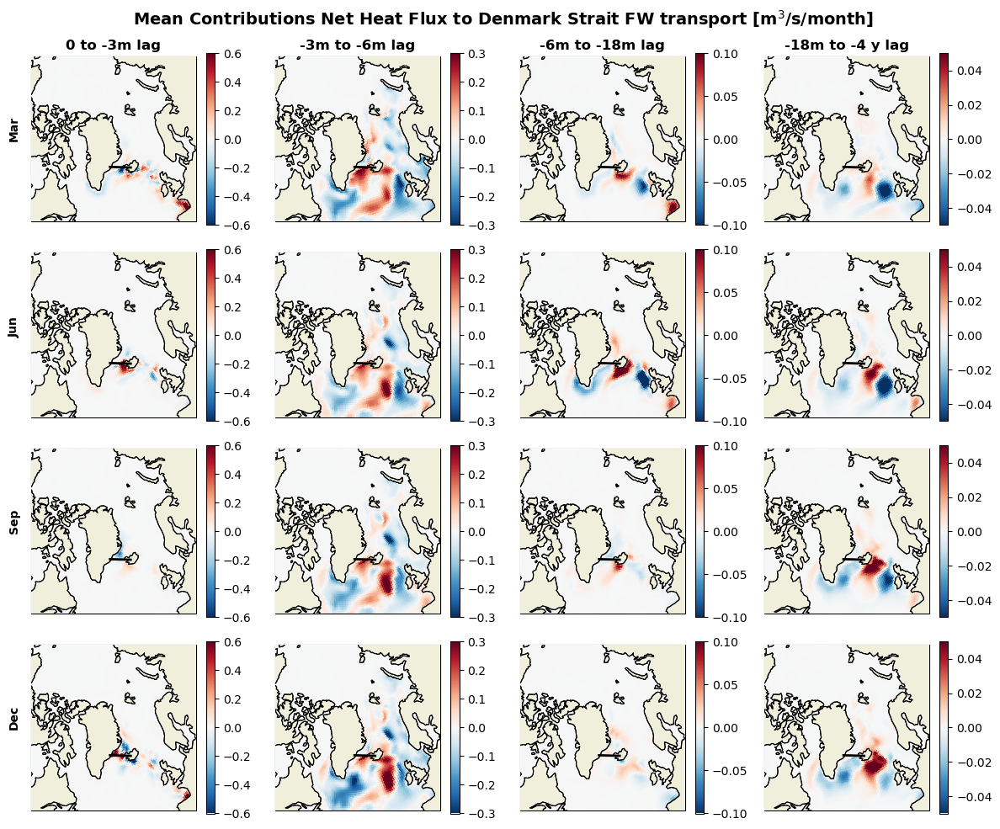

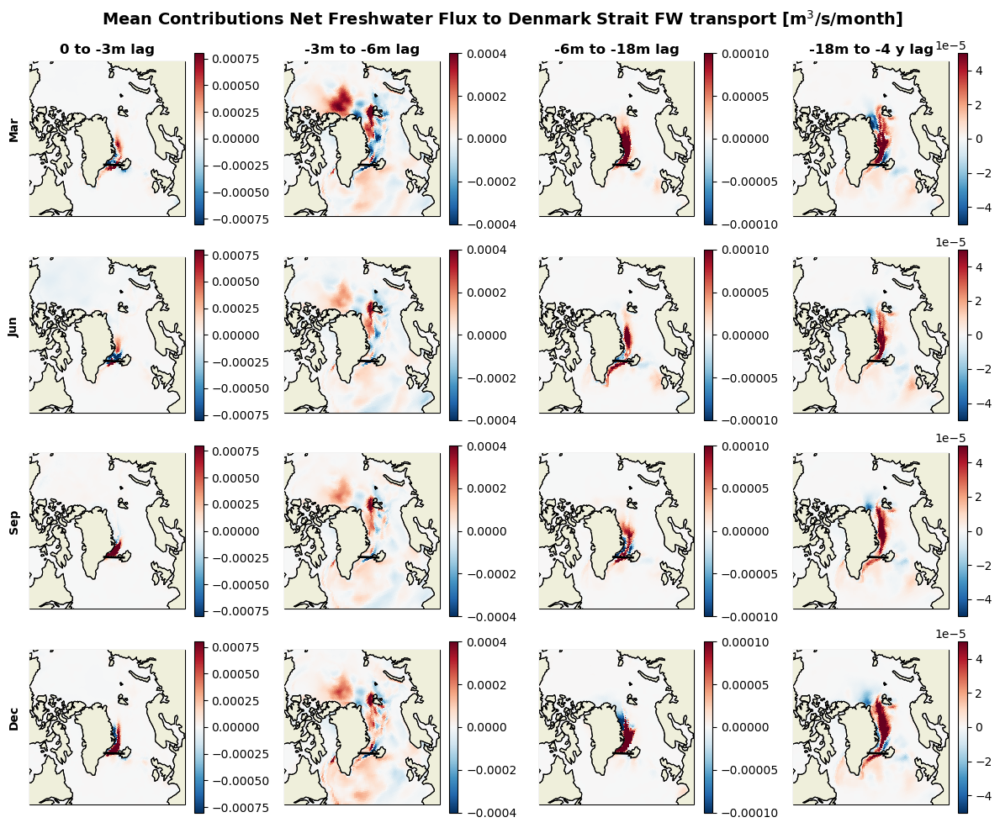

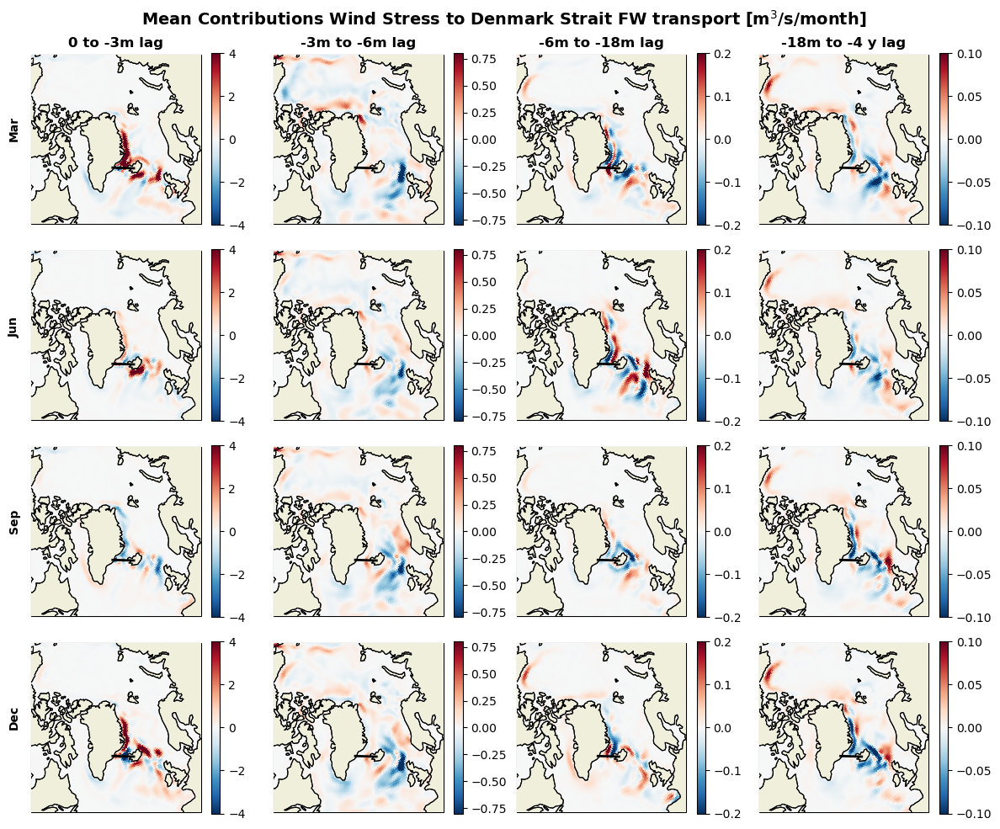

In [22]:
#plot_vars=['adxx_qnetXEXFqnet','adxx_empmrXEXFempmr','wind_OCE']
#var_label=['adxx_qnet','adxx_empmr','wind_OCE']
for iv,var in enumerate(plot_vars): 
    fig=plt.figure(figsize=[12,10])
    pp=1
    for mth in mth_i:
        mth_anom=(ds_plot_all[var].sel(month=mth)).mean(['eyear','year'])
        for ilag in range(0,len(lags)-1):
            [f,ax,p]=ut.plot_ecco(ecco_grid,(mth_anom.isel(lag_range=ilag))/(12*lag_lengths[ilag]),subplot_grid=[4,4,pp],
                               **proj_dict,
                               cmin=-clims[var_label[iv]][ilag],cmax=clims[var_label[iv]][ilag]
                              )
            ax.set_extent([xmin,xmax,ymin,ymax], crs=my_projn)
            ax.plot([section_pt1[0],section_pt2[0]],[section_pt1[1],section_pt2[1]],
                 color='k', linewidth=2,transform=ccrs.PlateCarree(),zorder=1000)
            if pp<5:
                plt.title(lag_labels[ilag],fontsize=12,fontweight='bold')
            if ilag==0:
                ax.text(-0.1,0.5,f'{imth[mth]}',transform=ax.transAxes,rotation='vertical',ha='center',fontweight='bold')
            pp+=1
    plt.suptitle(f'Mean Contributions {exf_labels[var_label[iv]]} to Denmark Strait FW transport [m$^3$/s/month]',fontsize=14,fontweight='bold')
    plt.tight_layout()

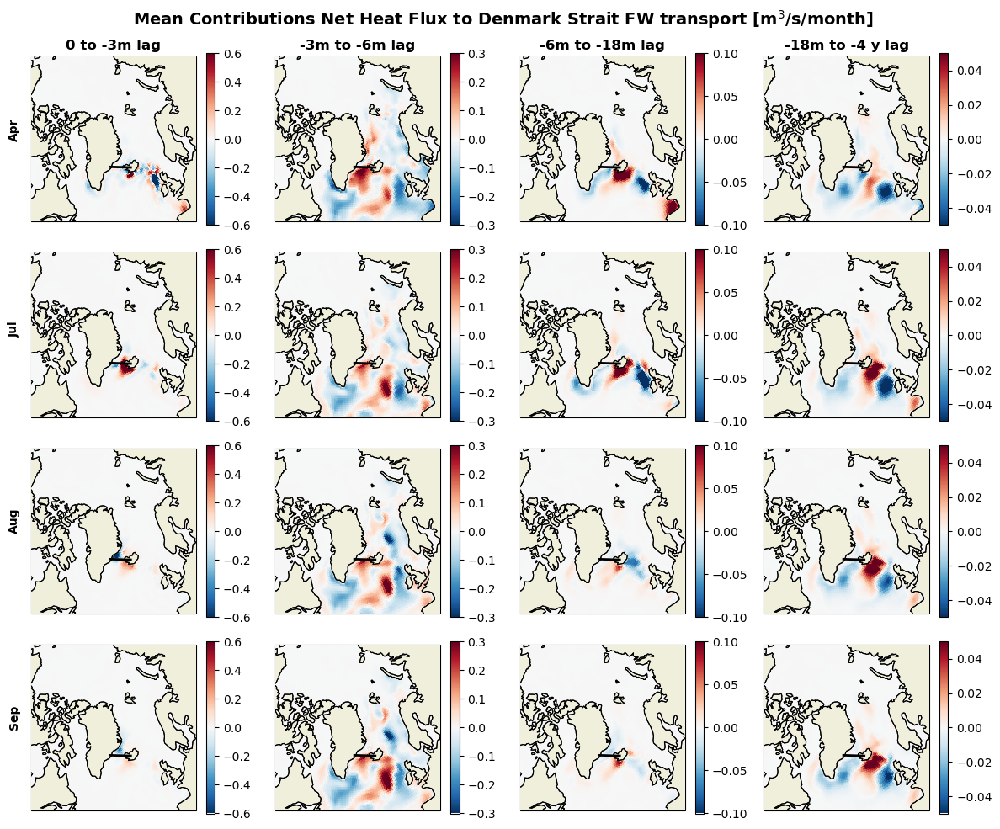

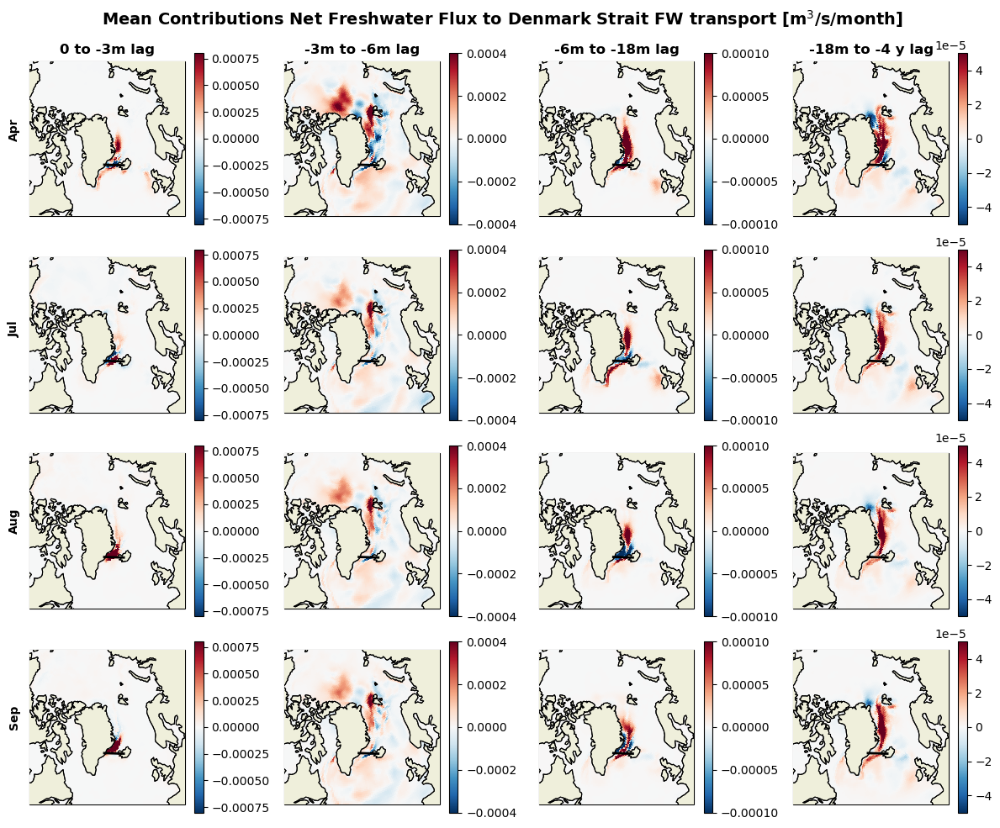

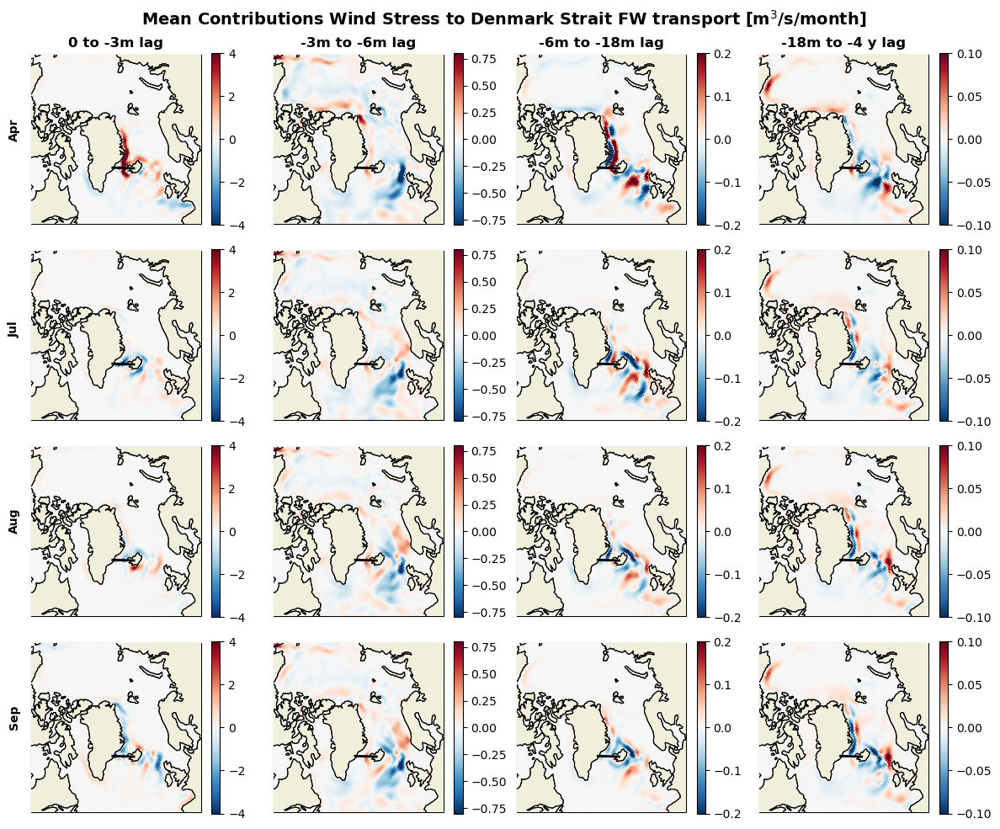

In [23]:
#plot_vars=['adxx_qnetXEXFqnet','adxx_empmrXEXFempmr','wind_OCE']
#var_label=['adxx_qnet','adxx_empmr','wind_OCE']
for iv,var in enumerate(plot_vars): 
    fig=plt.figure(figsize=[12,10])
    pp=1
    for mth in [4,7,8,9]:
        mth_anom=(ds_plot_all[var].sel(month=mth)).mean(['eyear','year'])
        for ilag in range(0,len(lags)-1):
            [f,ax,p]=ut.plot_ecco(ecco_grid,(mth_anom.isel(lag_range=ilag))/(12*lag_lengths[ilag]),subplot_grid=[4,4,pp],
                               **proj_dict,
                               cmin=-clims[var_label[iv]][ilag],cmax=clims[var_label[iv]][ilag]
                              )
            ax.set_extent([xmin,xmax,ymin,ymax], crs=my_projn)
            ax.plot([section_pt1[0],section_pt2[0]],[section_pt1[1],section_pt2[1]],
                 color='k', linewidth=2,transform=ccrs.PlateCarree(),zorder=1000)
            if pp<5:
                plt.title(lag_labels[ilag],fontsize=12,fontweight='bold')
            if ilag==0:
                ax.text(-0.1,0.5,f'{imth[mth]}',transform=ax.transAxes,rotation='vertical',ha='center',fontweight='bold')
            pp+=1
    plt.suptitle(f'Mean Contributions {exf_labels[var_label[iv]]} to Denmark Strait FW transport [m$^3$/s/month]',fontsize=14,fontweight='bold')
    plt.tight_layout()